In [ ]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [ ]:
from pyspark.sql import SparkSession
spark= SparkSession.builder.appName("Netflix data").getOrCreate()

In [ ]:
access_key = 'AKI'
secrect_key = 'Mzlo'
sc._jsc.hadoopConfiguration().set("fs.s3a.access.key", access_key)
sc._jsc.hadoopConfiguration().set("fs.s3a.secret.key", secrect_key)
aws_region="us-east-2"
sc._jsc.hadoopConfiguration().set("fs.s3a.endpoint", "s3." + aws_region+ ".amazonaws.com" )



In [ ]:
credits= spark.read.format("csv").option("header","true").option("inferschema","true").load("s3://storagelayer/netflix dataset/credits.csv")
credits.display()

person_id,id,name,character,role
3748,tm84618,Robert De Niro,Travis Bickle,ACTOR
14658,tm84618,Jodie Foster,Iris Steensma,ACTOR
7064,tm84618,Albert Brooks,Tom,ACTOR
3739,tm84618,Harvey Keitel,Matthew 'Sport' Higgins,ACTOR
48933,tm84618,Cybill Shepherd,Betsy,ACTOR
32267,tm84618,Peter Boyle,Wizard,ACTOR
519612,tm84618,Leonard Harris,Senator Charles Palantine,ACTOR
29068,tm84618,Diahnne Abbott,Concession Girl,ACTOR
519613,tm84618,Gino Ardito,Policeman at Rally,ACTOR
3308,tm84618,Martin Scorsese,Passenger Watching Silhouette,ACTOR


In [ ]:
from pyspark.sql.types import StructField, StructType, StringType, IntegerType, BooleanType, DecimalType 

In [ ]:
titles_schema = StructType([
    StructField("id", StringType(), True),
    StructField("title", StringType(), True),
    StructField("type", StringType(), True),
    StructField("description", StringType(), True),
    StructField("release_year", IntegerType(), True),
    StructField("age_certification", StringType(), True),
    StructField("runtime", IntegerType(), True),
    StructField("genres", StringType(), True),
    StructField("production_countries", StringType(), True),
    StructField("seasons", IntegerType(), True),
    StructField("imdb_id", StringType(), True),
    StructField("imdb_score", DecimalType(10, 2), True),  # Specify precision and scale for DecimalType
    StructField("imdb_votes", StringType(), True),
    StructField("tmdb_popularity", DecimalType(10, 2), True),  # Specify precision and scale for DecimalType
    StructField("tmdb_score", DecimalType(10, 2), True)  # Specify precision and scale for DecimalType
])

In [ ]:
title=spark.read.schema(titles_schema).format("csv").option("header","true").load("s3://storagelayer/netflix dataset/titles.csv")

In [ ]:
title.show()

+--------+--------------------+-----+--------------------+------------+--------------------+-------+--------------------+--------------------+-------+---------+----------+----------+---------------+----------+
|      id|               title| type|         description|release_year|   age_certification|runtime|              genres|production_countries|seasons|  imdb_id|imdb_score|imdb_votes|tmdb_popularity|tmdb_score|
+--------+--------------------+-----+--------------------+------------+--------------------+-------+--------------------+--------------------+-------+---------+----------+----------+---------------+----------+
|ts300399|Five Came Back: T...| SHOW|"This collection ...|        1945|               TV-MA|     51|   ['documentation']|              ['US']|   null|     null|      null|      null|           0.60|      null|
| tm84618|         Taxi Driver|MOVIE|A mentally unstab...|        1976|                   R|    114|  ['drama', 'crime']|              ['US']|   null|tt0075314|

In [ ]:
credits.createOrReplaceTempView("credits")


In [ ]:
%sql
select * from credits where name="Robert De Niro";

person_id,id,name,character,role
3748,tm84618,Robert De Niro,Travis Bickle,ACTOR
3748,tm155787,Robert De Niro,James Conway,ACTOR
3748,tm180542,Robert De Niro,David 'Noodles' Aaronson,ACTOR
3748,tm145608,Robert De Niro,Leonard Lowe,ACTOR
3748,tm311902,Robert De Niro,Himself (Uncredited),ACTOR
3748,tm244149,Robert De Niro,Frank Sheeran,ACTOR
3748,tm844497,Robert De Niro,Self,ACTOR


In [ ]:
result=spark.sql("select * from credits where character='Girl in Castle Anthrax'")
result.head(5)

Out[11]: [Row(person_id=1275018, id='tm127384', name='Elspeth Cameron', character='Girl in Castle Anthrax', role='ACTOR'),
 Row(person_id=1462970, id='tm127384', name='Mitsuko Forstater', character='Girl in Castle Anthrax', role='ACTOR'),
 Row(person_id=976111, id='tm127384', name='Sandy Rose', character='Girl in Castle Anthrax', role='ACTOR'),
 Row(person_id=90024, id='tm127384', name='Joni Flynn', character='Girl in Castle Anthrax', role='ACTOR'),
 Row(person_id=1462991, id='tm127384', name='Alison Walker', character='Girl in Castle Anthrax', role='ACTOR')]

In [ ]:
title=title.na.fill({"age_certification":"Not Rated", "seasons": 0})
title.display()

id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
ts300399,Five Came Back: The Reference Films,SHOW,"""This collection includes 12 World War II-era propaganda films — many of which are graphic and offensive — discussed in the docuseries """"Five Came Back.""""""",1945,TV-MA,51,['documentation'],['US'],0,null,null,null,0.60,null
tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18
tm154986,Deliverance,MOVIE,"Intent on seeing the Cahulawassee River before it's turned into one huge lake, outdoor fanatic Lewis Medlock takes his friends on a river-rafting trip they'll never forget into the dangerous American back-country.",1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],0,tt0068473,7.70,107673.0,10.01,7.30
tm127384,Monty Python and the Holy Grail,MOVIE,"""King Arthur, accompanied by his squire, recruits his Knights of the Round Table, including Sir Bedevere the Wise, Sir Lancelot the Brave, Sir Robin the Not-Quite-So-Brave-As-Sir-Lancelot and Sir Galahad the Pure. On the way, Arthur battles the Black Knight who, despite having had all his limbs chopped off, insists he can still fight. They reach Camelot, but Arthur decides not to enter, as """"it is a silly place"""".""",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],0,tt0071853,8.20,534486.0,15.46,7.81
tm120801,The Dirty Dozen,MOVIE,"12 American military prisoners in World War II are ordered to infiltrate a well-guarded enemy château and kill the Nazi officers vacationing there. The soldiers, most of whom are facing death sentences for a variety of violent crimes, agree to the mission and the possible commuting of their sentences.",1967,Not Rated,150,"['war', 'action']","['GB', 'US']",0,tt0061578,7.70,72662.0,20.40,7.60
ts22164,Monty Python's Flying Circus,SHOW,"A British sketch comedy series with the shows being composed of surreality, risqué or innuendo-laden humour, sight gags and observational sketches without punchlines.",1969,TV-14,30,"['comedy', 'european']",['GB'],0,tt0063929,8.80,73424.0,17.62,8.31
tm70993,Life of Brian,MOVIE,"Brian Cohen is an average young Jewish man, but through a series of ridiculous events, he gains a reputation as the Messiah. When he's not dodging his followers or being scolded by his shrill mother, the hapless Brian has to contend with the pompous Pontius Pilate and acronym-obsessed members of a separatist movement. Rife with Monty Python's signature absurdity, the tale finds Brian's life paralleling Biblical lore, albeit with many more laughs.",1979,R,94,['comedy'],['GB'],0,tt0079470,8.00,395024.0,17.77,7.80
tm14873,Dirty Harry,MOVIE,"When a madman dubbed 'Scorpio' terrorizes San Francisco, hard-nosed cop, Harry Callahan – famous for his take-no-prisoners approach to law enforcement – is tasked with hunting down the psychopath. Harry eventually collars Scorpio in the process of rescuing a kidnap victim, only to see him walk on technicalities. Now, the maverick detective is determined to nail the maniac himself.",1971,R,102,"['thriller', 'action', 'crime']",['US'],0,tt0066999,7.70,155051.0,12.82,7.50
tm119281,Bonnie and Clyde,MOVIE,"In the 1930s, bored waitress Bonnie Parker falls in love with an ex-con named Clyde Barrow and together they start a violent crime spree through the country, stealing cars and robbing banks.",1967,R,110,"['crime', 'drama', 'action']",['US'],0,tt0061418,7.70,112048.0,15.69,7.50
tm98978,The Blue Lagoon,MOVIE,"Two small children and a ship's cook survive a shipwreck and find safety on an idyllic tropical island. Soon, however, the cook dies and the young boy and girl are left on their own. Days become years and Emmeline and Richard make a home for themselves surrounded by exotic creat

In [ ]:
from pyspark.sql.functions import col, when

title = title.withColumn(
    "Hit Level",
    when(
        ((col("imdb_score") > 8) & (col("tmdb_score") > 8)) | (col("imdb_votes") > 40),
        True 
    ).otherwise(False)
)

In [ ]:
title=title.withColumn( "Film Type",
                       when(
                           (col("release_year")<2000) & (col("tmdb_popularity")>30), "Classics")
                       .when(
                           (col("release_year")>2000) & (col("tmdb_popularity")>30), "New Hits")
                       .otherwise("Non-Hits")
                       )

In [ ]:
title.display()

id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,Hit Level,Film Type
ts300399,Five Came Back: The Reference Films,SHOW,"""This collection includes 12 World War II-era propaganda films — many of which are graphic and offensive — discussed in the docuseries """"Five Came Back.""""""",1945,TV-MA,51,['documentation'],['US'],0,null,null,null,0.60,null,false,Non-Hits
tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
tm154986,Deliverance,MOVIE,"Intent on seeing the Cahulawassee River before it's turned into one huge lake, outdoor fanatic Lewis Medlock takes his friends on a river-rafting trip they'll never forget into the dangerous American back-country.",1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],0,tt0068473,7.70,107673.0,10.01,7.30,true,Non-Hits
tm127384,Monty Python and the Holy Grail,MOVIE,"""King Arthur, accompanied by his squire, recruits his Knights of the Round Table, including Sir Bedevere the Wise, Sir Lancelot the Brave, Sir Robin the Not-Quite-So-Brave-As-Sir-Lancelot and Sir Galahad the Pure. On the way, Arthur battles the Black Knight who, despite having had all his limbs chopped off, insists he can still fight. They reach Camelot, but Arthur decides not to enter, as """"it is a silly place"""".""",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],0,tt0071853,8.20,534486.0,15.46,7.81,true,Non-Hits
tm120801,The Dirty Dozen,MOVIE,"12 American military prisoners in World War II are ordered to infiltrate a well-guarded enemy château and kill the Nazi officers vacationing there. The soldiers, most of whom are facing death sentences for a variety of violent crimes, agree to the mission and the possible commuting of their sentences.",1967,Not Rated,150,"['war', 'action']","['GB', 'US']",0,tt0061578,7.70,72662.0,20.40,7.60,true,Non-Hits
ts22164,Monty Python's Flying Circus,SHOW,"A British sketch comedy series with the shows being composed of surreality, risqué or innuendo-laden humour, sight gags and observational sketches without punchlines.",1969,TV-14,30,"['comedy', 'european']",['GB'],0,tt0063929,8.80,73424.0,17.62,8.31,true,Non-Hits
tm70993,Life of Brian,MOVIE,"Brian Cohen is an average young Jewish man, but through a series of ridiculous events, he gains a reputation as the Messiah. When he's not dodging his followers or being scolded by his shrill mother, the hapless Brian has to contend with the pompous Pontius Pilate and acronym-obsessed members of a separatist movement. Rife with Monty Python's signature absurdity, the tale finds Brian's life paralleling Biblical lore, albeit with many more laughs.",1979,R,94,['comedy'],['GB'],0,tt0079470,8.00,395024.0,17.77,7.80,true,Non-Hits
tm14873,Dirty Harry,MOVIE,"When a madman dubbed 'Scorpio' terrorizes San Francisco, hard-nosed cop, Harry Callahan – famous for his take-no-prisoners approach to law enforcement – is tasked with hunting down the psychopath. Harry eventually collars Scorpio in the process of rescuing a kidnap victim, only to see him walk on technicalities. Now, the maverick detective is determined to nail the maniac himself.",1971,R,102,"['thriller', 'action', 'crime']",['US'],0,tt0066999,7.70,155051.0,12.82,7.50,true,Non-Hits
tm119281,Bonnie and Clyde,MOVIE,"In the 1930s, bored waitress Bonnie Parker falls in love with an ex-con named Clyde Barrow and together they start a violent crime spree through the country, stealing cars and robbing banks.",1967,R,110,"['crime', 'drama', 'action']",['US'],0,tt0061418,7.70,112048.0,15.69,7.50,true,Non-Hits
tm98978,The Blue Lagoon,MOVIE,"Two small children and a ship's cook survive a shipwreck and find safety on an idyllic tropical island. Soon, however, the cook dies

In [ ]:
#join= credits.join(title, credits.id==title.id, "inner")
credits = credits.withColumnRenamed("id", "credits_id")
title = title.withColumnRenamed("id", "title_id")
title = title.withColumnRenamed("Film Type", "Film_Type")

join = credits.join(title, credits.credits_id == title.title_id, "inner")
join.display()


person_id,credits_id,name,character,role,title_id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,Hit Level,Film_Type
3748,tm84618,Robert De Niro,Travis Bickle,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
14658,tm84618,Jodie Foster,Iris Steensma,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
7064,tm84618,Albert Brooks,Tom,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
3739,tm84618,Harvey Keitel,Matthew 'Sport' Higgins,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
48933,tm84618,Cybill Shepherd,Betsy,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
32267,tm84618,Peter Boyle,Wizard,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
519612,tm84618,Leonard Harris,Senator Charles Palantine,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
29068,tm84618,Diahnne Abbott,Concession Girl,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
519613,tm84618,Gino Ardito,Policeman at Rally,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics
3308,tm84618,Martin Scorsese,Passenger Watching Silhouette,ACTOR,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York City where the perceived decadence and sleaze feed his urge for violent action.,1976,R,114,"['drama', 'crime']",['US'],0,tt0075314,8.20,808582.0,40.97,8.18,true,Classics


In [ ]:

join.createOrReplaceTempView("joined_table")
result=spark.sql("SELECT credits_id, title, name, Film_Type FROM joined_table WHERE type='MOVIE' AND imdb_score > 8")
result.show(40)

+----------+--------------------+------------------+---------+
|credits_id|               title|              name|Film_Type|
+----------+--------------------+------------------+---------+
|   tm84618|         Taxi Driver|    Robert De Niro| Classics|
|   tm84618|         Taxi Driver|      Jodie Foster| Classics|
|   tm84618|         Taxi Driver|     Albert Brooks| Classics|
|   tm84618|         Taxi Driver|     Harvey Keitel| Classics|
|   tm84618|         Taxi Driver|   Cybill Shepherd| Classics|
|   tm84618|         Taxi Driver|       Peter Boyle| Classics|
|   tm84618|         Taxi Driver|    Leonard Harris| Classics|
|   tm84618|         Taxi Driver|    Diahnne Abbott| Classics|
|   tm84618|         Taxi Driver|       Gino Ardito| Classics|
|   tm84618|         Taxi Driver|   Martin Scorsese| Classics|
|   tm84618|         Taxi Driver|     Murray Moston| Classics|
|   tm84618|         Taxi Driver|     Richard Higgs| Classics|
|   tm84618|         Taxi Driver|       Bill Minkin| Cl

In [ ]:
max_rating=spark.sql("SELECT DISTINCT release_year, title, imdb_score FROM joined_table WHERE (release_year, imdb_score) IN (SELECT release_year, MAX(imdb_score) FROM joined_table GROUP BY release_year) Order by release_year ASC")
max_rating.show()

+------------+--------------------+----------+
|release_year|               title|imdb_score|
+------------+--------------------+----------+
|        1954|     White Christmas|      7.50|
|        1956|         Dark Waters|      6.70|
|        1958|       Cairo Station|      7.50|
|        1959|               Ujala|      6.60|
|        1960|           Singapore|      6.40|
|        1961|The Guns of Navarone|      7.50|
|        1963|Saladin the Victo...|      7.60|
|        1966|   The Professionals|      7.30|
|        1967|     The Dirty Dozen|      7.70|
|        1967|    Bonnie and Clyde|      7.70|
|        1969|Monty Python's Fl...|      8.80|
|        1971|         Dirty Harry|      7.70|
|        1972|Monty Python's Fl...|      8.10|
|        1973|         Khoon Khoon|      5.10|
|        1974|          Manoranjan|      6.50|
|        1975|Monty Python and ...|      8.20|
|        1976|         Taxi Driver|      8.20|
|        1977|    Hitler: A Career|      7.50|
|        1978

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [imdb_score] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


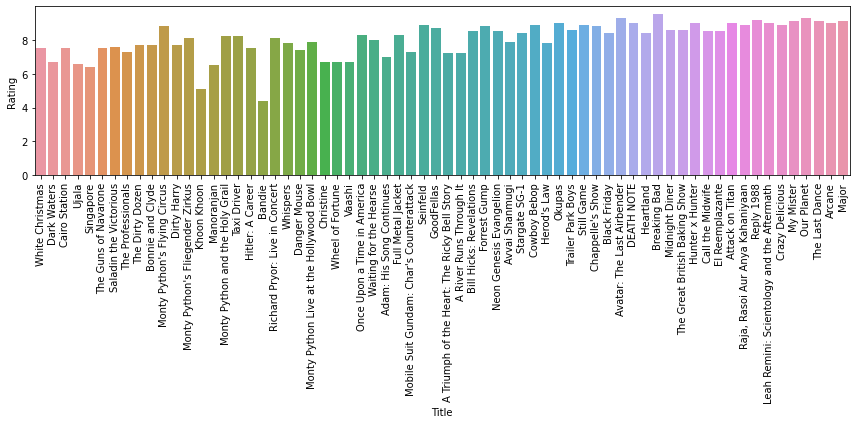

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
vis=max_rating.toPandas()
plt.figure(figsize=(12,6))
sns.barplot(x='title', y='imdb_score', data=vis)
plt.title=('Highest Rating Per Year')
plt.xlabel('Title')
plt.ylabel('Rating')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
max_rating.write.mode("overwrite").saveAsTable("max_rating_table");

In [ ]:
max_rating.coalesce(1).write.mode("overwrite").option("header", "true").csv("s3://storagelayer/databricks op file/")